In [ ]:
import torch
from torch import nn
import torchvision
from torchvision import transforms
import torch.nn.functional as F
import PIL
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

# **pretrained model:**
we can use pretraind models with ```torchvsion.models```
- see more: https://pytorch.org/vision/main/models.html

## **1.VGG16**
<img src="https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png" width="600">

In [ ]:
from torchsummary import summary
model = torchvision.models.vgg16(pretrained=True).to(device)
print("\n---------Here is the model--------")
summary(model, input_size=(3, 224, 244))

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



---------Here is the model--------
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 244]           1,792
              ReLU-2         [-1, 64, 224, 244]               0
            Conv2d-3         [-1, 64, 224, 244]          36,928
              ReLU-4         [-1, 64, 224, 244]               0
         MaxPool2d-5         [-1, 64, 112, 122]               0
            Conv2d-6        [-1, 128, 112, 122]          73,856
              ReLU-7        [-1, 128, 112, 122]               0
            Conv2d-8        [-1, 128, 112, 122]         147,584
              ReLU-9        [-1, 128, 112, 122]               0
        MaxPool2d-10          [-1, 128, 56, 61]               0
           Conv2d-11          [-1, 256, 56, 61]         295,168
             ReLU-12          [-1, 256, 56, 61]               0
           Conv2d-13          [-1, 256, 56, 61]         590,080
   

### **Normalize:**
- All pre-trained models expect input images **normalized**. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be the same as model input.
- VGG16: The images have to be loaded in to a range of [0, 1] and then normalized using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]. You can use the following transform to normalize:

`normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])`

In [ ]:
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

### **Note**
**NOTE**
- ```model.eval()```
- Dropouts Layers, BatchNorm Layers ..., you need to turn off them during model evaluation
- eval() will do it for you. In addition, the common practice for evaluating/validation is using ```torch.no_grad()``` in pair with ```model.eval()``` to turn off gradients computation:

In [ ]:
model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# imageNet Class label names
!wget https://raw.githubusercontent.com/rajeevratan84/ModernComputerVision/main/imageNetclasses.json

--2023-04-27 15:16:38--  https://raw.githubusercontent.com/rajeevratan84/ModernComputerVision/main/imageNetclasses.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33567 (33K) [text/plain]
Saving to: ‘imageNetclasses.json.1’

imageNetclasses.jso 100%[===================>]  32.78K  --.-KB/s    in 0.003s  

2023-04-27 15:16:39 (12.3 MB/s) - ‘imageNetclasses.json.1’ saved [33567/33567]



### **Create Predict function**

In [ ]:
import json
from PIL import Image

with open('imageNetclasses.json') as f:
  class_names = json.load(f)


def predict_image(images, class_names):
    to_pil = transforms.ToPILImage()

    index=[]
    for (i,image) in enumerate(images):
      # Convert to image and tensor
      image = to_pil(image)
      image_tensor = test_transform(image).float().unsqueeze_(0)
      input = torch.autograd.Variable(image_tensor).to(device)

      output = model(input)
      index.append(output.data.cpu().numpy().argmax())
      
      
    # Plot image
    fig=plt.figure(figsize=(16,16))
    rows, cols = 3, 3
    for i in range(1, len(images)):
        idx = index[i]
        img, label = images[i], class_names[str(idx)]
        fig.add_subplot(rows, cols, i)
        plt.imshow(to_pil(img))
        plt.title(label)
        plt.axis(False)
    plt.show()

def get_images(directory='path/to/imageFolder'):
    data = torchvision.datasets.ImageFolder(directory, transform=test_transform)
    num_images = len(data)
    loader = torch.utils.data.DataLoader(data, batch_size=num_images)
    dataiter = iter(loader)
    images, labels = next(dataiter)
    return images

In [ ]:
!gdown --id 1VyfggIFN2H6cubfh3_yUdicNicZa9sAp
!unzip images.zip

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1VyfggIFN2H6cubfh3_yUdicNicZa9sAp
To: /content/images.zip
100% 1.46M/1.46M [00:00<00:00, 154MB/s]
Archive:  images.zip
replace images/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

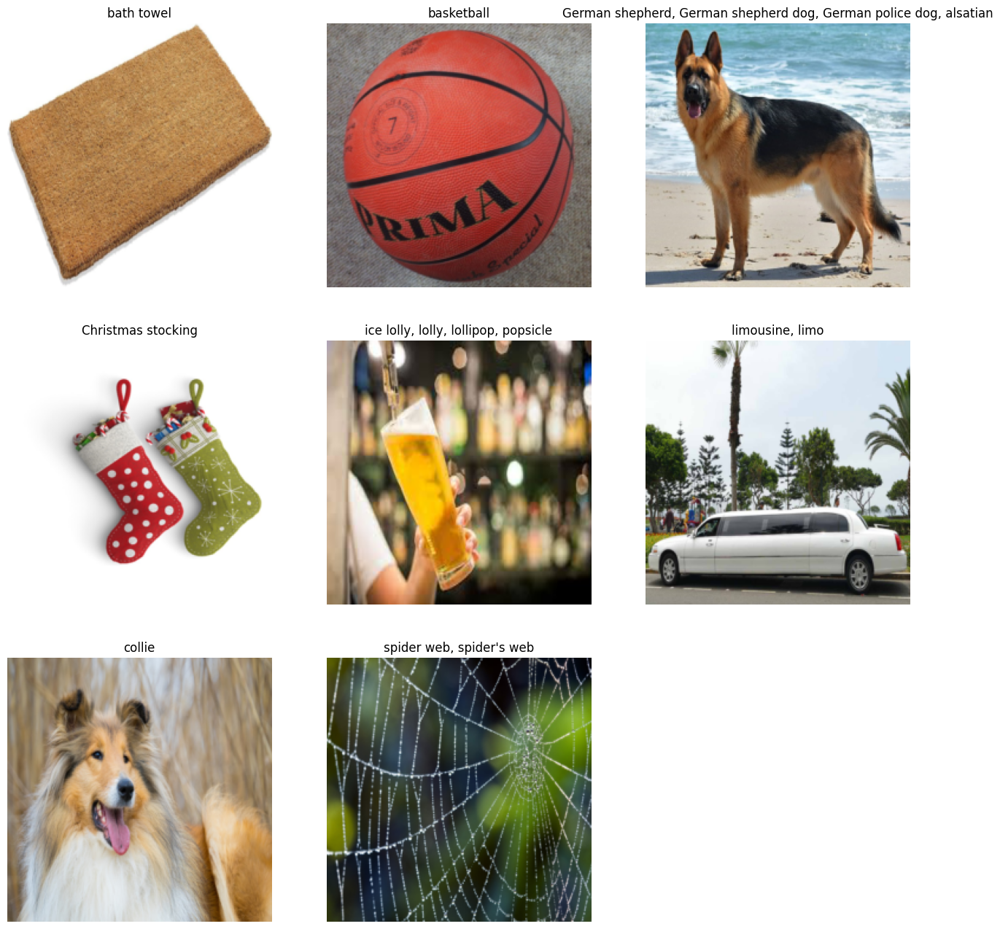

In [ ]:
images = get_images('/content/images/')
predict_image(images, class_names)

## **2.ResNe**t
<img src="https://www.researchgate.net/publication/336642248/figure/fig1/AS:839151377203201@1577080687133/Original-ResNet-18-Architecture.png">

In [ ]:
from torchsummary import summary
model = torchvision.models.resnet18(pretrained=True).to(device)
print("\n---------Here is the model--------")
model.eval()
summary(model, input_size=(3, 224, 244))


---------Here is the model--------
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 122]           9,408
       BatchNorm2d-2         [-1, 64, 112, 122]             128
              ReLU-3         [-1, 64, 112, 122]               0
         MaxPool2d-4           [-1, 64, 56, 61]               0
            Conv2d-5           [-1, 64, 56, 61]          36,864
       BatchNorm2d-6           [-1, 64, 56, 61]             128
              ReLU-7           [-1, 64, 56, 61]               0
            Conv2d-8           [-1, 64, 56, 61]          36,864
       BatchNorm2d-9           [-1, 64, 56, 61]             128
             ReLU-10           [-1, 64, 56, 61]               0
       BasicBlock-11           [-1, 64, 56, 61]               0
           Conv2d-12           [-1, 64, 56, 61]          36,864
      BatchNorm2d-13           [-1, 64, 56, 61]             128
   

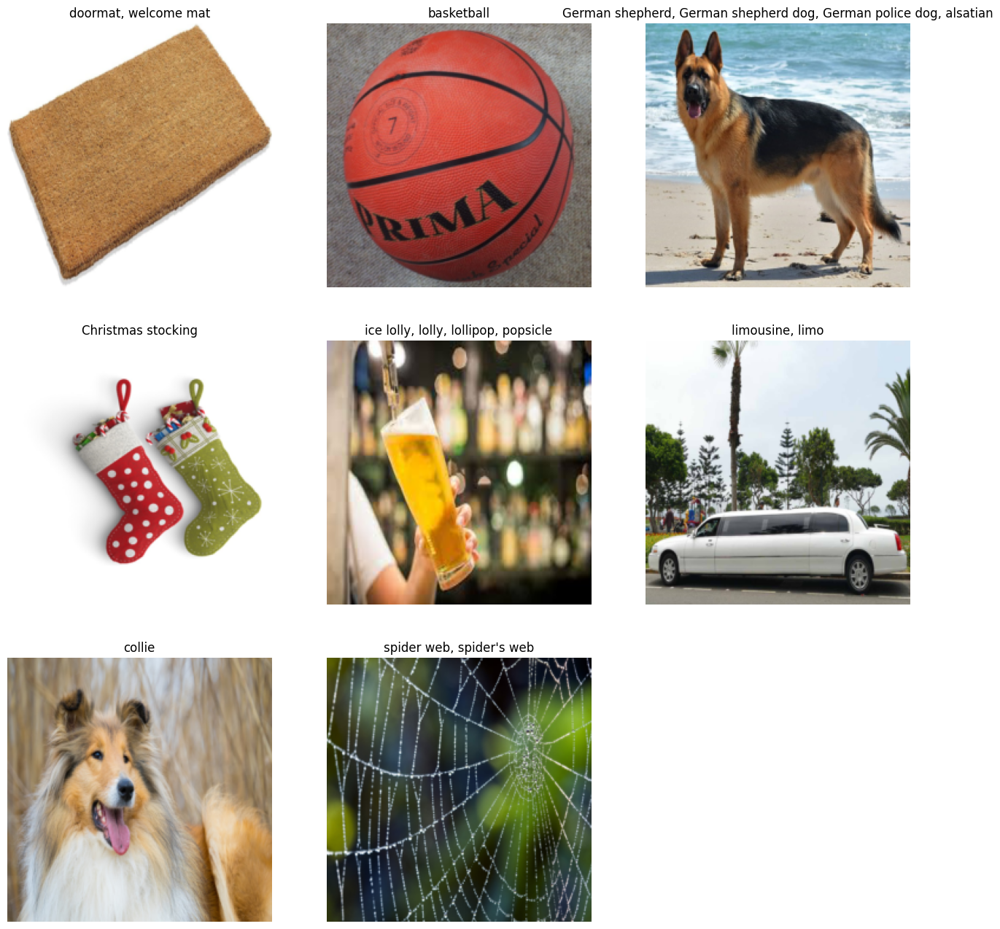

In [ ]:
images = get_images('/content/images/')
predict_image(images, class_names)

## **Inception_V3**
<img src="https://www.researchgate.net/publication/328775405/figure/fig3/AS:690150061400065@1541556005669/Convolutional-neural-network-architecture-Inception-v3-used-in-this-study-Inception-v3.png">

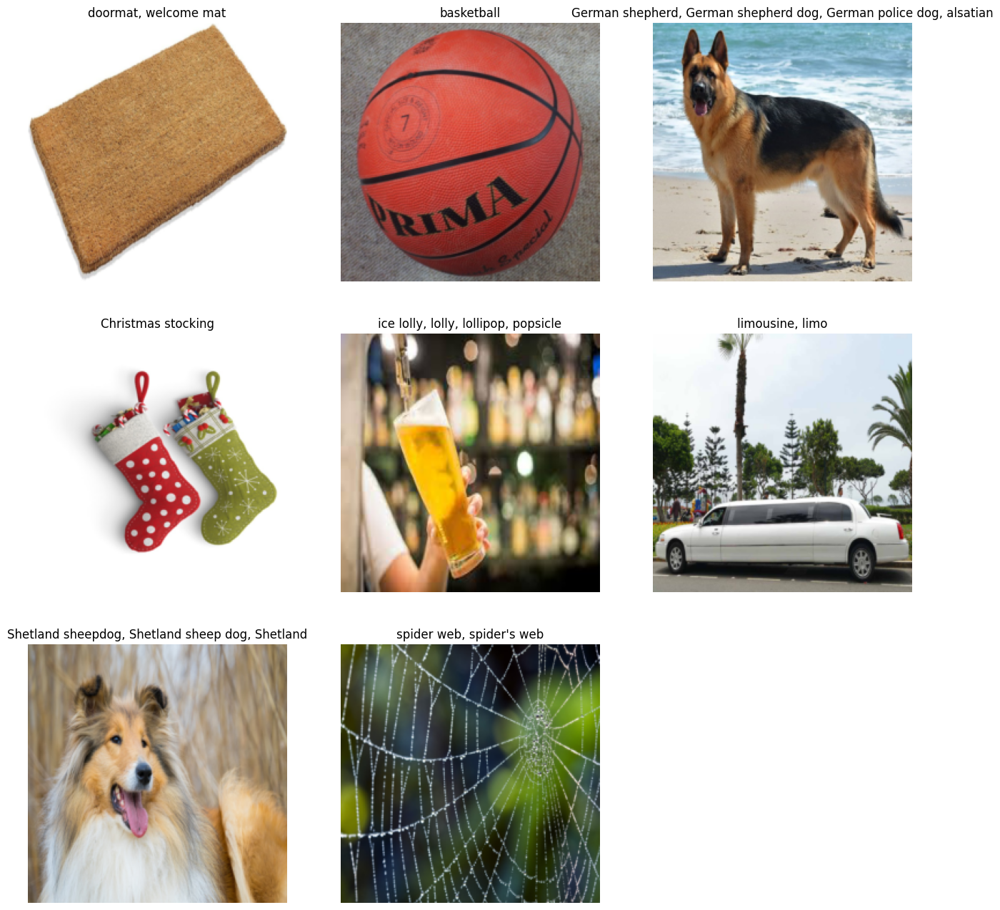

In [ ]:
from torchsummary import summary
model = torchvision.models.inception_v3(pretrained=True).to(device)
model.eval()
#print("\n---------Here is the model--------")
#summary(model, input_size=(3, 299, 299))

images = get_images('/content/images/')
predict_image(images, class_names)

## **MobileNet_V2**
<img src="https://www.researchgate.net/publication/352562068/figure/fig2/AS:1037139642953729@1624284768840/Architecture-of-MobileNetV2.png" width="500">

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 57.8MB/s]


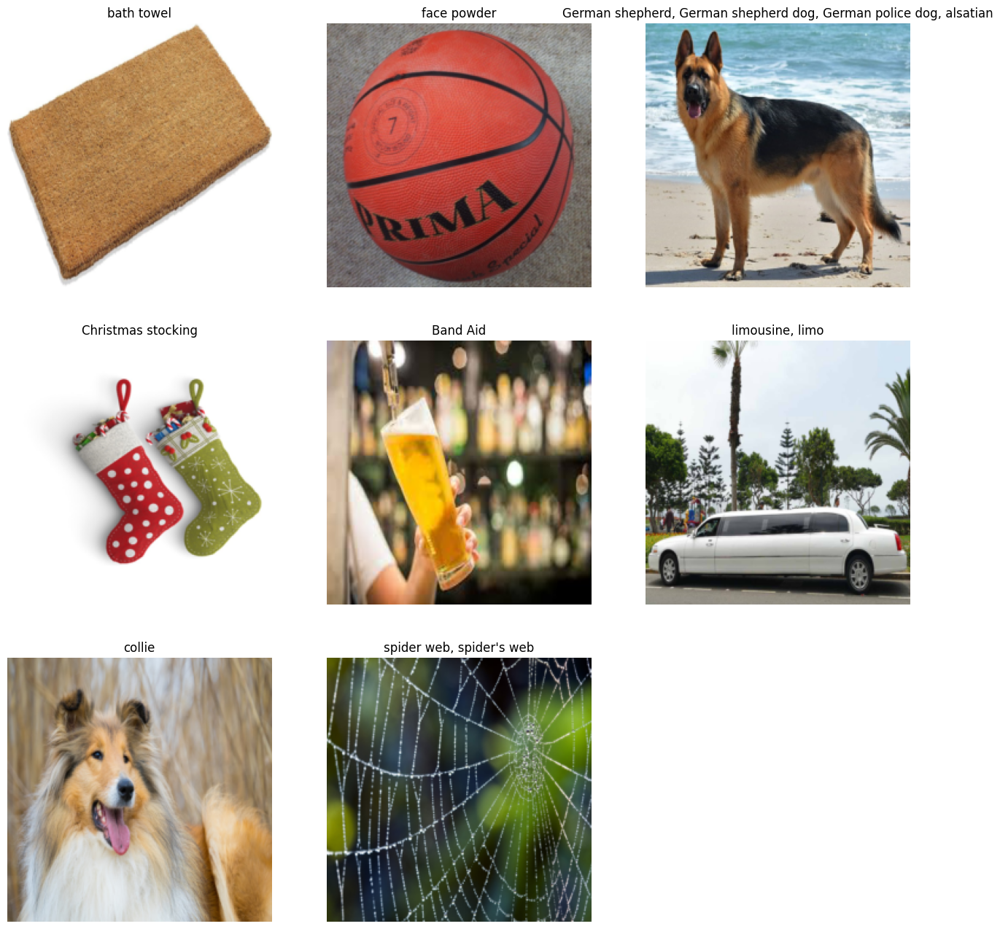

In [ ]:
from torchsummary import summary
model = torchvision.models.mobilenet_v2(pretrained=True).to(device)
model.eval()
#print("\n---------Here is the model--------")
#summary(model, input_size=(3, 299, 299))

images = get_images('/content/images/')
predict_image(images, class_names)

## **SqueezeNet**

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/squeezenet1_0-b66bff10.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_0-b66bff10.pth
100%|██████████| 4.78M/4.78M [00:00<00:00, 63.4MB/s]


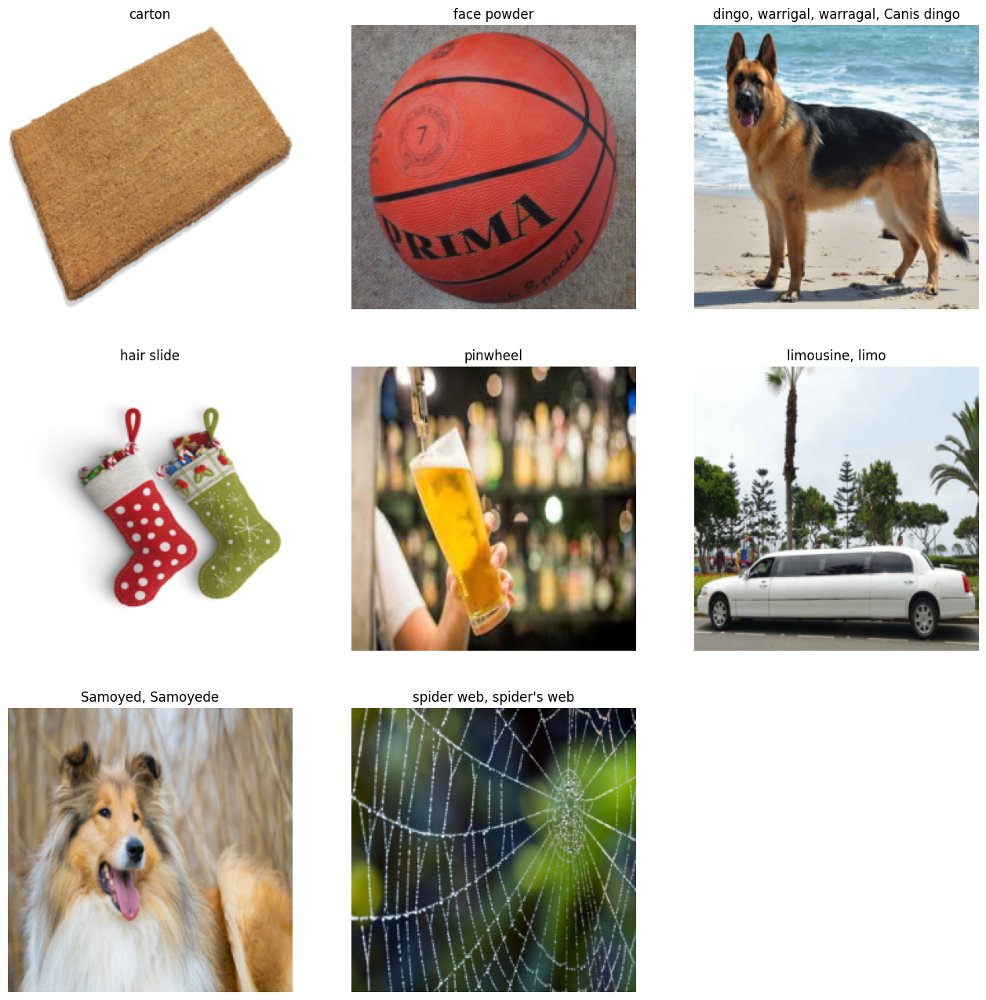

In [ ]:
from torchsummary import summary
model = torchvision.models.squeezenet1_0(pretrained=True).to(device)
model.eval()
#print("\n---------Here is the model--------")
#summary(model, input_size=(3, 299, 299))

images = get_images('/content/images/')
predict_image(images, class_names)

## **Wide ResNet**

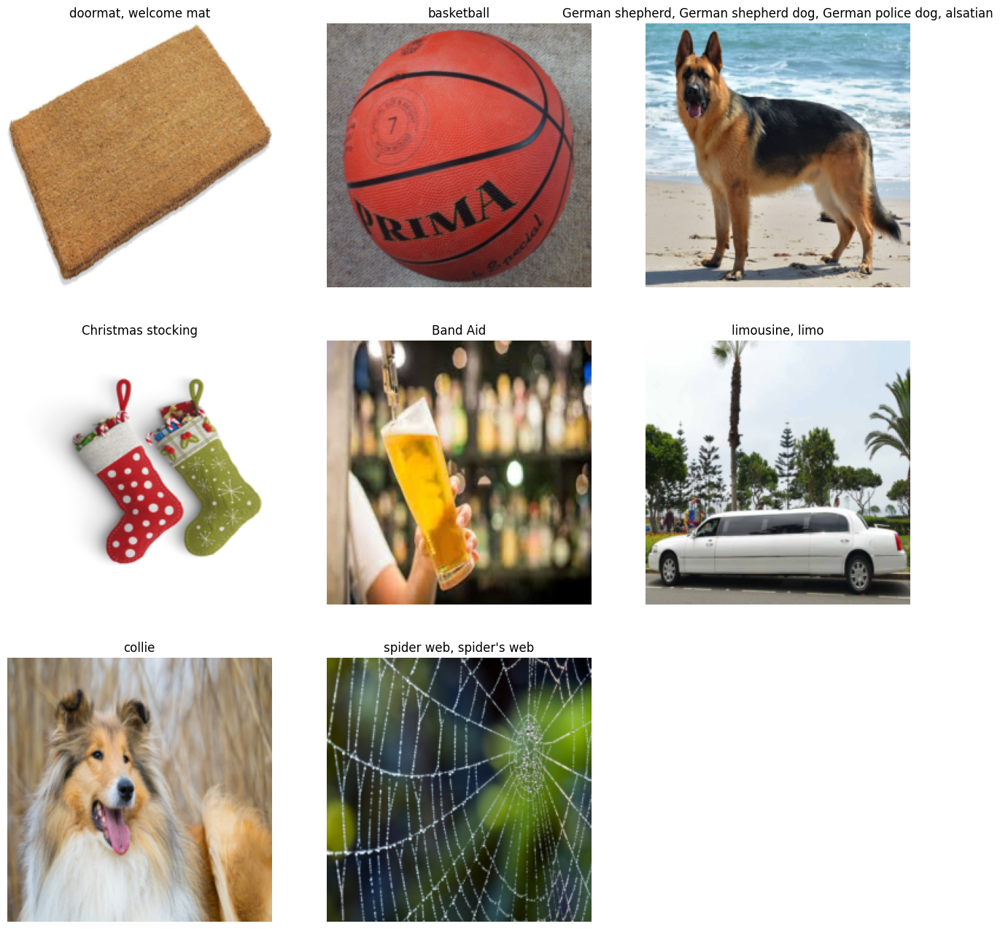

In [ ]:
from torchsummary import summary
model = torchvision.models.wide_resnet50_2(pretrained=True).to(device)
model.eval()
#print("\n---------Here is the model--------")
#summary(model, input_size=(3, 299, 299))

images = get_images('/content/images/')
predict_image(images, class_names)

## **Wide MNASNet**

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MNASNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=MNASNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mnasnet1.0_top1_73.512-f206786ef8.pth" to /root/.cache/torch/hub/checkpoints/mnasnet1.0_top1_73.512-f206786ef8.pth
100%|██████████| 16.9M/16.9M [00:00<00:00, 69.2MB/s]


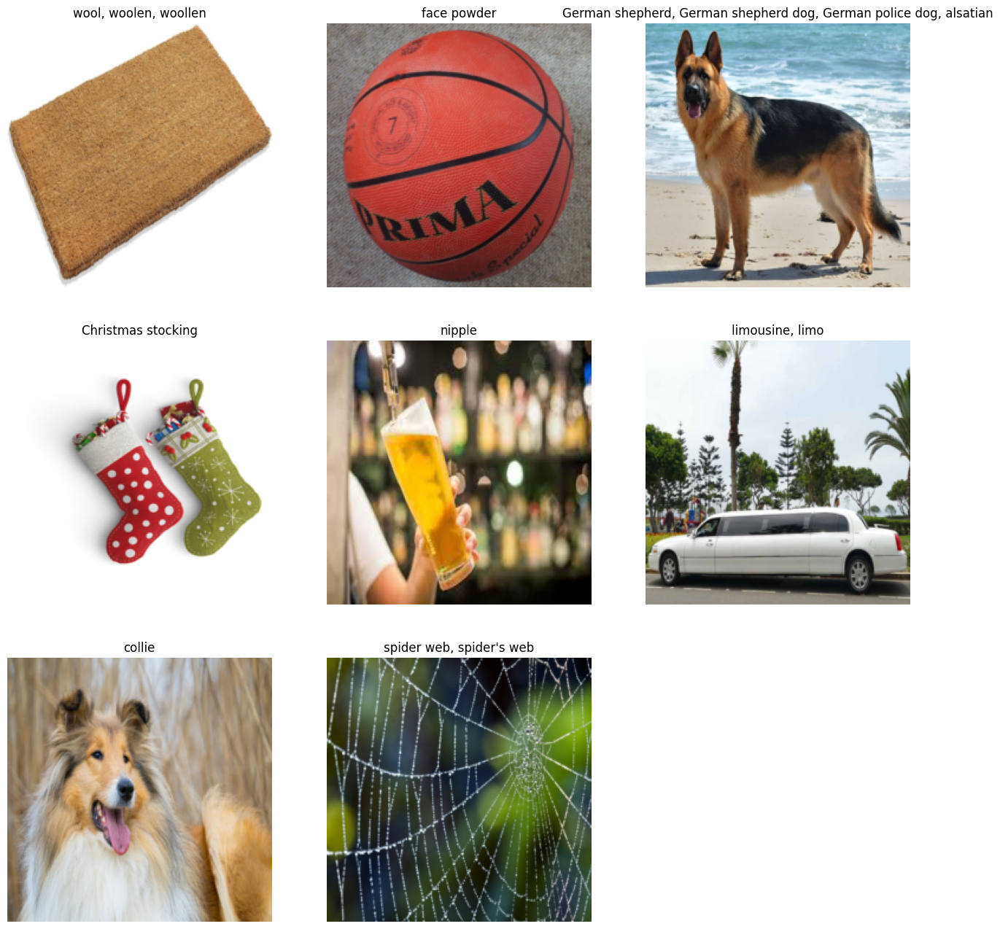

In [ ]:
from torchsummary import summary
model = torchvision.models.mnasnet1_0(pretrained=True).to(device)
model.eval()
#print("\n---------Here is the model--------")
#summary(model, input_size=(3, 299, 299))

images = get_images('/content/images/')
predict_image(images, class_names)